# Theory_Baseline


This file is the implementation of the theoretical baseline. According to our expert, the data follows an exponential formula being $-k * e^((-1/\tau)*x) + k$. We fit the parameter k and $\tau$ on existing data. These parameter are fitted for each slope in the data. Therefore, we plot the parameters per difference in input and fit a quadratic or linear function to model this relation of parameters over difference.

With these functions, we can predict the parameters $k$ and $\tau$ by using the differences in input. Having $k$ and $\tau$ we can put them back in the exponential formulas providing a prediction for the course.

## Preliminaries

We need the following specification, so tables are left aligned and not centered

In [1]:
%%html
<style>
    table {float:left}
</style>

### Import libraries

In [2]:
# own libraries
import Global_Functions as gf
import Data_Processing as dp
#python libraries
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scipy
from sklearn import metrics
import time
timestr = time.strftime("%Y-%m-%d_%H-%M/")

In [3]:
np.random.seed(123)

### Specify parameters for model fitting

In [4]:
TRAINING_DATA = 50
SAMPLE_RATE = 1
DATA_SPEC = "quadratic_40_0_linear_10"

## Load Data

### Experimental data

In [5]:
# the data needs to be preprocessed using file 01_Preprocessing_Data
OPEN_FOLDER = '../Data/Preped_Data/' 

In [6]:
ex_1 = gf.open_CSV_file('experiment_1_short.csv', OPEN_FOLDER)
ex_4 = gf.open_CSV_file('experiment_4_short.csv', OPEN_FOLDER)
ex_9 = gf.open_CSV_file('experiment_9_short.csv', OPEN_FOLDER)
ex_20 = gf.open_CSV_file('experiment_20_short.csv', OPEN_FOLDER)
ex_21 = gf.open_CSV_file('experiment_21_short.csv', OPEN_FOLDER)
ex_22 = gf.open_CSV_file('experiment_22_short.csv', OPEN_FOLDER)
ex_23 = gf.open_CSV_file('experiment_23_short.csv', OPEN_FOLDER)
ex_24 = gf.open_CSV_file('experiment_24_short.csv', OPEN_FOLDER)

In [7]:
experiments = [ex_1, ex_4, ex_9, ex_20, ex_21, ex_22, ex_23, ex_24]
names = ['1', '4', '9', '20', '21','22', '23', '24']

In [8]:
#this is needed, to apply the same name for every experiment which differ due to the preprocessing
for exp in experiments:
    spin_head = exp.filter(regex = ("spin.*"))
    exp['spin_power'] = spin_head

### Synthetical Data

In [9]:
# the synthetic data needs to be created using file 03_Synthetic_Data
OPEN_SYNTHETIC = '../Data/Synthetic_Data/Without_Noise/Sample_Ratio_{0}/{1}'.format(SAMPLE_RATE, DATA_SPEC)

In [10]:
experiments = gf.load_synthetic(OPEN_SYNTHETIC, length = 300)
names = [str(x+1) for x in range(len(experiments))]
names[0] = "0_hand"
SCALER = gf.get_scaler(OPEN_SYNTHETIC)

### Specify saving folder

In [11]:
image_folder = "../Images/Turbines/Theoretical_Approach/" + timestr
gf.check_folder(image_folder)

Creation of directory ../Images/Turbines/Theoretical_Approach/2021-07-15_09-47/ successful.


In [12]:
train = "on {} courses".format(str(TRAINING_DATA))
ex_train = experiments[:][:int(TRAINING_DATA)]

In [13]:
specs = {
    'data': 'Synthetic - {}'.format(DATA_SPEC),
    'data_size': '{} for training'.format(TRAINING_DATA),
    'sampling_rate': SAMPLE_RATE
}

specs_str = ""
for cat, descr in specs.items():
    specs_str += f'{cat}: {descr} \n'

with open(image_folder + "00_specs.txt", "w") as text_file:
    text_file.write(specs_str)

## Stationary parameters

One possibility is to use known parameters for power and spinning according to the corresponding input. With this simple approximation we ignore transition phases. We use them to show our naive approach is still better than just the stationary fit.

In [14]:
def stationary_fit(experiment):
    fit_voltage = [3,5,7.5, 10]
    fit_spin = [3103, 3250, 3604, 3961]
    fit_el = [1200, 1637, 2509, 3300]
    fit_th = [10480, 11700, 14700, 18690]

    prm_fit_st_th, pcov_th = scipy.optimize.curve_fit(gf.quadr_func, fit_voltage, fit_th, maxfev = 3000)
    prm_fit_st_el, pcov_el = scipy.optimize.curve_fit(gf.quadr_func, fit_voltage, fit_el, maxfev = 3000)
    prm_fit_st_spin, pcov_spin = scipy.optimize.curve_fit(gf.quadr_func, fit_voltage, fit_spin, maxfev = 3000)
    
    p1, p2, p3 = prm_fit_st_th
    experiment['th_pred'] = gf.quadr_func(experiment['input_voltage'], p1, p2, p3)
    p1, p2, p3 = prm_fit_st_el
    experiment['el_pred'] = gf.quadr_func(experiment['input_voltage'], p1, p2, p3)
    p1, p2, p3 = prm_fit_st_spin
    experiment['spin_pred'] = gf.quadr_func(experiment['input_voltage'], p1, p2, p3)
    
    return experiment

## Methods for approximation

In [15]:
# approximate values for one slope by using the exponential function. Adapt if necessary
def approximation(time, values):
    assert len(time) == len(values), 'time and values should have the same length'
    param_bounds = ([-np.inf, -np.inf], [np.inf, np.inf]) # parameter bounds for parameter optimization
    
    #measure time and values only as difference within segment
    x = time - time[0]
    y = values - values[0]
    
    stride = int(max(1, len(x)/200))
    
    #use scipy to optimize parameters. Create starting points by optimizing a subsample of data. Chneg formula if need be
    if len(x) > 2:
        init_opt = scipy.optimize.curve_fit(gf.exp_func, x[0:len(x):stride], y[0:len(y):stride], maxfev = 30000)[0]
        para_fit, pcov = scipy.optimize.curve_fit(gf.exp_func, x, y, bounds=param_bounds, p0 = init_opt, maxfev = 3000000)
    else:
        para_fit = [0,1] # default values without information
    k_best = para_fit[0]
    tau_best = para_fit[1]
    return k_best, tau_best

In [16]:
# approximate an entire course.
def all_approximations(data_time, data_input, data_value, time_splits):
    approximations = np.full(shape = len(data_time), fill_value= np.nan)
    parameters = []    
    start = time.time()
    
    for t in range(len(time_splits) -1):
        cut_point_prior = math.ceil(time_splits[t])
        cut_point_post = math.ceil(time_splits[t+1])
        time_segment = np.array(data_time[cut_point_prior:cut_point_post])
        value_segment = np.array(data_value[cut_point_prior:cut_point_post])
        input_start = data_input[cut_point_prior]
        input_end = data_input[cut_point_post -1]
       
        #find optimal parameters for slope
        k_best, tau_best = approximation(time_segment, value_segment)
        #predict values for same segment
        segment_approximation = gf.exp_func(time_segment-time_segment[0], k_best, tau_best) + value_segment[0]
        approximations[cut_point_prior:cut_point_post] = segment_approximation
        prs = [input_start, input_end, k_best, tau_best]
        parameters = np.concatenate((parameters, prs), axis = 0)        
        
    end = time.time()
    duration = end - start
    
    return approximations, parameters.reshape(len(time_splits) -1, 4), duration

In [17]:
# get time steps where a change in input occurs
def get_time_splits(df):
    time_splits = [x for x in range(len(df)-1) if df.iloc[x]['input_voltage'] != df.iloc[x+1]['input_voltage']]
    if len(time_splits) > 20:
        time_splits = time_splits[::2]
    time_splits.append(len(df))
    if time_splits[0] != 0:
        time_splits.insert(0,0)
    return time_splits

## Comparison of fits 

We compare all experiments according to their fits. This was initially done to compare the exponential fit to the stationary fit. We discovered that in all experiments the exponential fit is far better than the stationary fit. Therefore, we focused on improving the fit by includign the modelling of the fitting parameters.

Comparison of the approaches and fits compared to true values:

Variable|Approach|RMSE|R^2|MAE|MaxAE
---|----|----:|----:|---:|---:
**Spinning**|**exponential**|**37.264**|**0.987**|**23.183**|**129.704**
Spinning|stationary|210.845|0.570|98.725|868.402
**Electric**|**exponential**|**109.274**|**0.982**|**72.463**|**375.395**
Electric|stationary| 518.049|0.589|239.259|2166.749
**Thermal**|**exponential**|**1105.615**|**0.882**|**925.458**|**3662.547**
Thermal|stationary|2444.558|0.423|1618.027|10083.339

In [18]:
def compare_fits(experiment, name, images = False):
    #values = ['spin', 'el', 'th']
    values = ['el']
    parameters = []
    duration = []
    
    time_splits = get_time_splits(experiment)
    experiment = stationary_fit(experiment)
    
    for n in values:
        experiment[str(n + '_approx')], pms, dur = all_approximations(experiment['time'], experiment['input_voltage'], experiment[str(n +'_power')], time_splits)
        parameters.append(pms)
        duration.append(dur)
        
        if images:
            fig, axs = plt.subplots(figsize = (15,10))
            line1, = axs.plot(experiment['time'], experiment[str(n +'_power')], color = gf.get_color('grey'), label = 'true')
            line2, = axs.plot(experiment['time'], experiment[str(n +'_approx')], color = gf.get_color('red'), label = 'fit')
            #line3, = axs.plot(experiment['time'], experiment[str(n +'_pred')], color = gf.get_color('cyan'), label = 'stationary fit')
#             axs.set_title('Visualization of fit on ' + name, fontsize = 25)
            axs.set_xlabel('time [sec]', fontsize = 18)
            axs.set_ylabel('electric power [W]' , fontsize = 18)
            axs.legend([line1, line2], ['true', 'fit'], loc = 'upper right')

            fig.savefig(image_folder + name + "_" + n + "_fits.png")
            fig.savefig(image_folder + name + "_" + n + "_fits.svg")
        
        print('-------------- Differences on ' + name + ' ' + n + ' stationary fit----------------')
        gf.measure_difference(experiment[str(n + '_power')], experiment[str(n + '_pred')])
        print('-------------- Differences on ' + name + ' ' + n + ' exponential fit ----------------')
        gf.measure_difference(experiment[str(n + '_power')], experiment[str(n + '_approx')])        

        
    return parameters, duration

# Meta Model
Since the exponential fits show promising results we decided to try to predict the fits. We did so by fitting one existing experiment and mapping the parameters k and tau of each slope to the according difference in input. We found the best describing function for this mapping with the information of our expert, that the stationary phases (k) have quadratic terms and the steepness (tau) is linear.

In [19]:
def df_out_of_fitting_parameters(params):
    df_params = pd.DataFrame(params)
    df_params.columns = ['input_start', 'input_end', 'k_best', 'tau_best']
    df_params['Input_diff'] = [df_params.iloc[x]['input_end'] - df_params.iloc[x]['input_start'] for x in range(len(df_params))]
    return df_params

In [20]:
def parameter_modelling(df_params, func_k, func_tau, name, images = False):
    df_params = df_params[df_params['k_best'].between(-4200, 4200)]
    df_params = df_params[df_params['tau_best'].between(0, 1000)]
    prm_fit_k, pcov_k = scipy.optimize.curve_fit(func_k, df_params['Input_diff'], df_params['k_best'])
    prm_fit_tau, pcov_tau = scipy.optimize.curve_fit(func_tau, df_params['Input_diff'], df_params['tau_best'])
    
    tau1, tau2, tau3 = prm_fit_tau
    k1, k2 = prm_fit_k
    
    input_default = np.arange(-10.0, 10.0, 0.2)
    
    if images:
        fig,axs = plt.subplots(1, 2, figsize = (15,10))
        axs = axs.ravel()
        axs[1].scatter(df_params['Input_diff'], df_params['tau_best'], label = 'tau')
        axs[1].plot(input_default, func_tau(input_default, tau1, tau2, tau3), color = gf.get_color('orange'), linewidth = 2)
#         axs[1].set_title('tau over input difference for ' + name)
        axs[1].set_ylabel(r'$\tau$', fontsize = 18)
        axs[1].set_xlabel('input difference', fontsize = 18)
        axs[0].scatter(df_params['Input_diff'], df_params['k_best'], label ='k')
        axs[0].plot(input_default, func_k(input_default, k1, k2), color = gf.get_color('orange'), linewidth = 2)
#         axs[0].set_title('k over input difference for ' + name)
        axs[0].set_ylabel('k', fontsize = 18)
        axs[0].set_xlabel('input difference', fontsize = 18)

        plt.savefig(image_folder + name + "_k_tau.png")
        plt.savefig(image_folder + name + "_k_tau.svg")
    
    return prm_fit_k, prm_fit_tau

In [21]:
def train_meta_modell(train_experiment, train_name):
    parameters = []
    durations = []
    for i in ex_train:
        prm, dur = compare_fits(i, train_name, images = True)
        parameters.append(prm)
        durations.append(dur)
    
    #name_categories = ['_spin', '_electric', '_thermal']
    name_categories = "_electric"
    models = []
    df_p = pd.DataFrame()
    for j in parameters:
        df_p = pd.concat([df_p, df_out_of_fitting_parameters(j[0])])
    mod = parameter_modelling(df_p, gf.linear_func, gf.quadr_func, name_categories, images = True)
    models.append(mod)
    return models

C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 622.126
The R2-score is 0.786
The MAE is 519.963
The MaxAE is 2290.392
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 83.827
The R2-score is 0.996
The MAE is 37.560
The MaxAE is 462.420


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 529.699
The R2-score is 0.585
The MAE is 490.055
The MaxAE is 1836.769
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 45.758
The R2-score is 0.997
The MAE is 18.196
The MaxAE is 326.508


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 501.193
The R2-score is 0.712
The MAE is 407.577
The MaxAE is 1914.715
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 46.476
The R2-score is 0.998
The MAE is 20.174
The MaxAE is 288.648


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 652.888
The R2-score is 0.509
The MAE is 561.468
The MaxAE is 3165.432
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 72.364
The R2-score is 0.994
The MAE is 33.592
The MaxAE is 346.528


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 747.807
The R2-score is -0.436
The MAE is 706.980
The MaxAE is 2210.299
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 56.775
The R2-score is 0.992
The MAE is 25.195
The MaxAE is 289.226


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 560.345
The R2-score is 0.283
The MAE is 537.932
The MaxAE is 1736.934
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 46.918
The R2-score is 0.995
The MAE is 14.696
The MaxAE is 629.332


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 650.865
The R2-score is 0.642
The MAE is 525.626
The MaxAE is 3117.528
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 57.499
The R2-score is 0.997
The MAE is 29.301
The MaxAE is 327.995


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 530.637
The R2-score is 0.711
The MAE is 455.853
The MaxAE is 1831.003
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 39.422
The R2-score is 0.998
The MAE is 13.713
The MaxAE is 305.764


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 598.344
The R2-score is -0.157
The MAE is 568.842
The MaxAE is 2217.453
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 31.815
The R2-score is 0.997
The MAE is 8.759
The MaxAE is 279.962


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 748.435
The R2-score is 0.707
The MAE is 653.562
The MaxAE is 2653.279
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 104.423
The R2-score is 0.994
The MAE is 55.232
The MaxAE is 456.476


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 556.730
The R2-score is 0.219
The MAE is 499.624
The MaxAE is 2565.914
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 53.359
The R2-score is 0.993
The MAE is 20.846
The MaxAE is 364.840


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 688.695
The R2-score is 0.450
The MAE is 600.763
The MaxAE is 3115.870
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 107.390
The R2-score is 0.987
The MAE is 51.065
The MaxAE is 530.586


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 554.593
The R2-score is 0.333
The MAE is 486.235
The MaxAE is 2910.138
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 50.643
The R2-score is 0.994
The MAE is 13.882
The MaxAE is 414.572


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 649.613
The R2-score is 0.389
The MAE is 582.867
The MaxAE is 2262.862
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 42.992
The R2-score is 0.997
The MAE is 15.950
The MaxAE is 324.102


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 513.578
The R2-score is 0.705
The MAE is 411.441
The MaxAE is 2791.809
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 70.258
The R2-score is 0.994
The MAE is 29.254
The MaxAE is 445.097


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 760.450
The R2-score is 0.635
The MAE is 662.285
The MaxAE is 3279.646
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 124.406
The R2-score is 0.990
The MAE is 62.842
The MaxAE is 587.472


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 625.832
The R2-score is 0.678
The MAE is 565.061
The MaxAE is 1974.925
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 89.056
The R2-score is 0.993
The MAE is 47.068
The MaxAE is 395.894


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 460.372
The R2-score is 0.845
The MAE is 398.121
The MaxAE is 2307.303
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 43.733
The R2-score is 0.999
The MAE is 15.886
The MaxAE is 305.113


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 636.535
The R2-score is 0.823
The MAE is 592.515
The MaxAE is 2160.708
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 85.263
The R2-score is 0.997
The MAE is 40.919
The MaxAE is 427.214


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 717.916
The R2-score is -0.165
The MAE is 661.837
The MaxAE is 2618.581
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 72.768
The R2-score is 0.988
The MAE is 34.718
The MaxAE is 437.228


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 560.503
The R2-score is 0.497
The MAE is 461.221
The MaxAE is 2432.005
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 60.568
The R2-score is 0.994
The MAE is 28.103
The MaxAE is 340.517


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 663.249
The R2-score is 0.744
The MAE is 612.063
The MaxAE is 2062.405
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 72.327
The R2-score is 0.997
The MAE is 38.899
The MaxAE is 316.923


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 658.826
The R2-score is -0.183
The MAE is 623.044
The MaxAE is 2001.878
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 26.384
The R2-score is 0.998
The MAE is 9.729
The MaxAE is 187.842


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 428.871
The R2-score is 0.641
The MAE is 353.214
The MaxAE is 2035.068
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 39.040
The R2-score is 0.997
The MAE is 13.453
The MaxAE is 289.714


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 597.829
The R2-score is 0.766
The MAE is 430.737
The MaxAE is 3189.560
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 113.017
The R2-score is 0.992
The MAE is 59.586
The MaxAE is 558.138


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 680.271
The R2-score is -0.944
The MAE is 665.288
The MaxAE is 1443.717
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 11.913
The R2-score is 0.999
The MAE is 2.639
The MaxAE is 128.689


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 652.820
The R2-score is 0.703
The MAE is 519.247
The MaxAE is 2788.174
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 93.370
The R2-score is 0.994
The MAE is 50.496
The MaxAE is 426.166


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 675.186
The R2-score is 0.767
The MAE is 582.132
The MaxAE is 3189.868
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 116.248
The R2-score is 0.993
The MAE is 55.222
The MaxAE is 571.822


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 632.807
The R2-score is 0.823
The MAE is 572.793
The MaxAE is 2704.497
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 71.147
The R2-score is 0.998
The MAE is 25.481
The MaxAE is 482.874


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 559.164
The R2-score is 0.655
The MAE is 460.543
The MaxAE is 3079.805
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 78.802
The R2-score is 0.993
The MAE is 30.019
The MaxAE is 491.647


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 744.871
The R2-score is 0.562
The MAE is 678.508
The MaxAE is 3267.964
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 117.333
The R2-score is 0.989
The MAE is 51.900
The MaxAE is 588.663


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Global_Functions.py:229: RuntimeWarning: overflow encountered in double_scalars
  ans = -k* math.exp((-1/tau)*i) +k
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 741.164
The R2-score is 0.351
The MAE is 679.625
The MaxAE is 2634.638
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 72.211
The R2-score is 0.994
The MAE is 28.657
The MaxAE is 454.494


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Global_Functions.py:229: RuntimeWarning: overflow encountered in double_scalars
  ans = -k* math.exp((-1/tau)*i) +k
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 658.839
The R2-score is 0.398
The MAE is 593.061
The MaxAE is 2148.694
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 51.817
The R2-score is 0.996
The MAE is 22.239
The MaxAE is 312.007


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 568.518
The R2-score is 0.760
The MAE is 518.448
The MaxAE is 2166.279
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 65.361
The R2-score is 0.997
The MAE is 30.182
The MaxAE is 348.193


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 688.065
The R2-score is 0.642
The MAE is 615.896
The MaxAE is 2968.956
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 91.382
The R2-score is 0.994
The MAE is 42.485
The MaxAE is 495.580


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 680.649
The R2-score is 0.774
The MAE is 570.649
The MaxAE is 3196.041
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 131.900
The R2-score is 0.992
The MAE is 74.054
The MaxAE is 566.160


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 709.309
The R2-score is -1.083
The MAE is 692.811
The MaxAE is 1479.456
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 16.800
The R2-score is 0.999
The MAE is 4.419
The MaxAE is 153.223


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 581.699
The R2-score is 0.684
The MAE is 512.937
The MaxAE is 1844.154
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 55.768
The R2-score is 0.997
The MAE is 23.077
The MaxAE is 333.480


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 691.263
The R2-score is -0.625
The MAE is 656.788
The MaxAE is 2173.253
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 33.032
The R2-score is 0.996
The MAE is 9.769
The MaxAE is 267.592


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 612.413
The R2-score is 0.656
The MAE is 458.817
The MaxAE is 2412.263
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 76.069
The R2-score is 0.995
The MAE is 39.250
The MaxAE is 342.283


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 406.930
The R2-score is 0.761
The MAE is 331.768
The MaxAE is 2161.978
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 44.065
The R2-score is 0.997
The MAE is 15.241
The MaxAE is 314.823


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Global_Functions.py:229: RuntimeWarning: overflow encountered in double_scalars
  ans = -k* math.exp((-1/tau)*i) +k
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 679.534
The R2-score is 0.739
The MAE is 564.645
The MaxAE is 3252.745
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 102.665
The R2-score is 0.994
The MAE is 47.201
The MaxAE is 569.391


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\FlorianLeiser\Documents\Masterarbeit\Code\Global_Functions.py:229: RuntimeWarning: overflow encountered in double_scalars
  ans = -k* math.exp((-1/tau)*i) +k
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 606.981
The R2-score is -0.740
The MAE is 596.141
The MaxAE is 1673.482
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 15.722
The R2-score is 0.999
The MAE is 4.589
The MaxAE is 147.725


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 352.663
The R2-score is 0.745
The MAE is 292.629
The MaxAE is 2348.844
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 38.085
The R2-score is 0.997
The MAE is 10.733
The MaxAE is 317.002


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 462.019
The R2-score is 0.793
The MAE is 346.303
The MaxAE is 2448.080
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 36.386
The R2-score is 0.999
The MAE is 15.583
The MaxAE is 228.173


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 677.439
The R2-score is -2.630
The MAE is 672.475
The MaxAE is 1506.998
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 8.338
The R2-score is 0.999
The MAE is 1.493
The MaxAE is 114.238


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 577.660
The R2-score is 0.710
The MAE is 436.035
The MaxAE is 2801.593
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 92.061
The R2-score is 0.993
The MAE is 47.469
The MaxAE is 430.346


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 564.480
The R2-score is 0.791
The MAE is 458.143
The MaxAE is 2503.146
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 86.966
The R2-score is 0.995
The MAE is 43.895
The MaxAE is 438.423


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 706.454
The R2-score is 0.706
The MAE is 578.945
The MaxAE is 2842.325
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 115.531
The R2-score is 0.992
The MAE is 62.261
The MaxAE is 455.862


C:\Users\FlorianLeiser\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-18-e6965a6dfe3d>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on train on on 50 courses el stationary fit----------------
The RMSE is 573.407
The R2-score is 0.778
The MAE is 485.643
The MaxAE is 1906.374
-------------- Differences on train on on 50 courses el exponential fit ----------------
The RMSE is 73.931
The R2-score is 0.996
The MAE is 35.966
The MaxAE is 550.902


<ipython-input-20-d934a05ce7dc>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axs = plt.subplots(1, 2, figsize = (15,10))


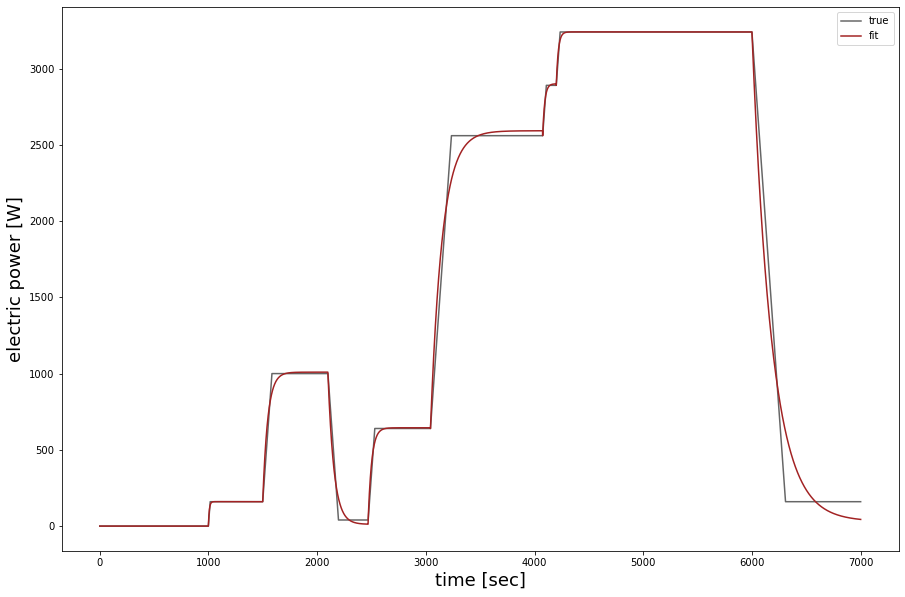

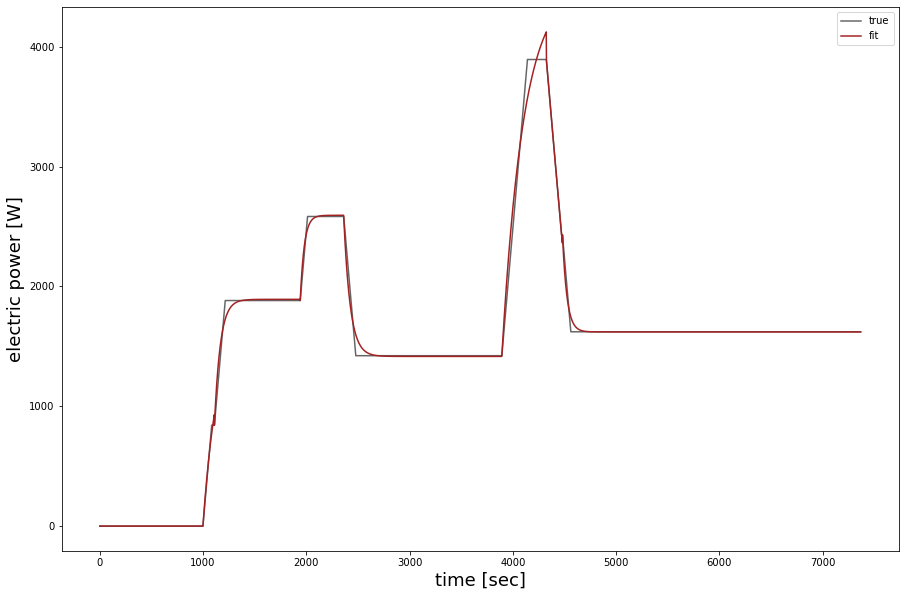

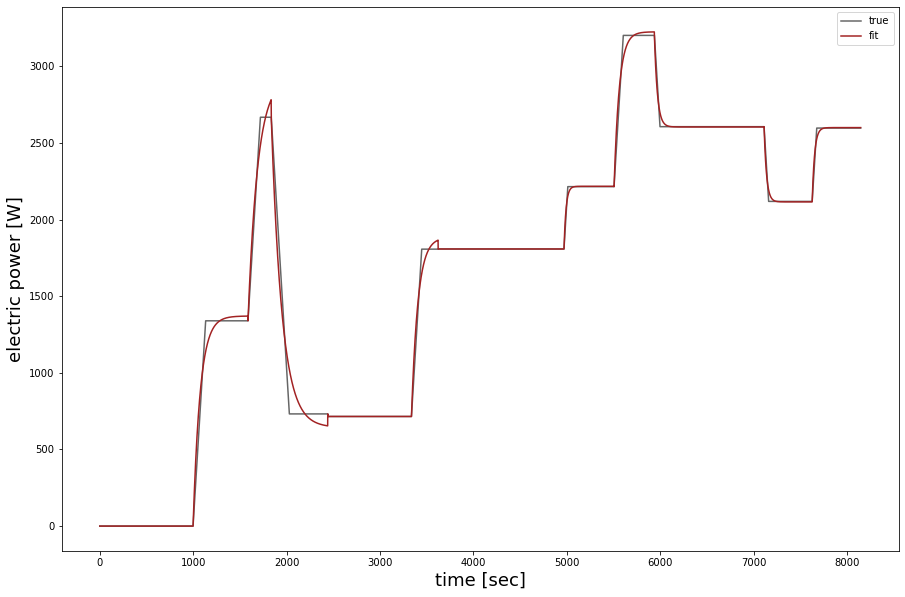

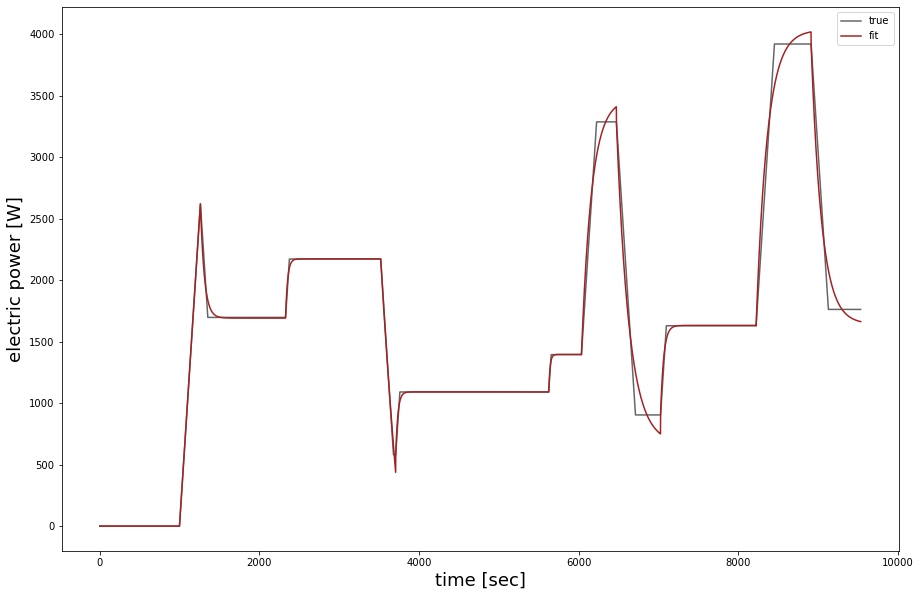

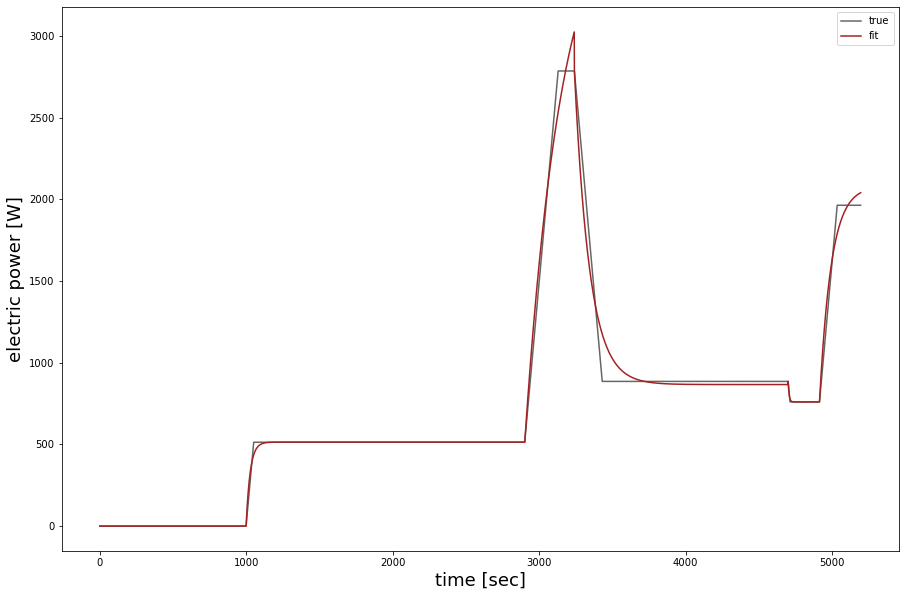

...

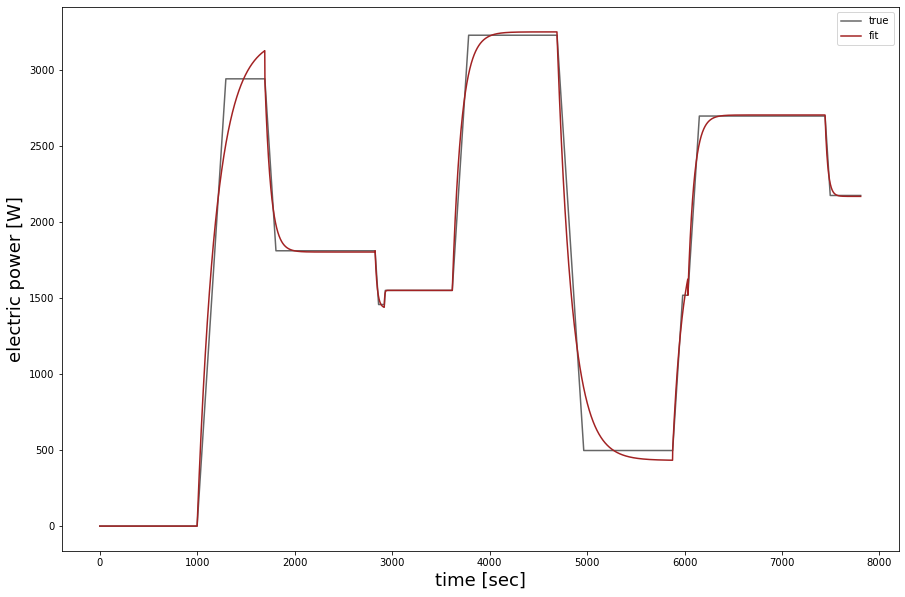

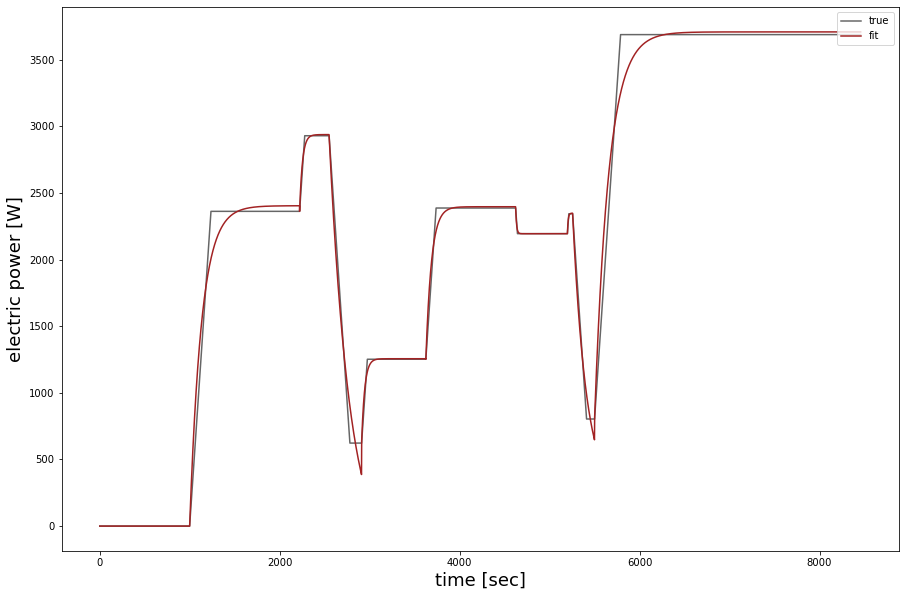

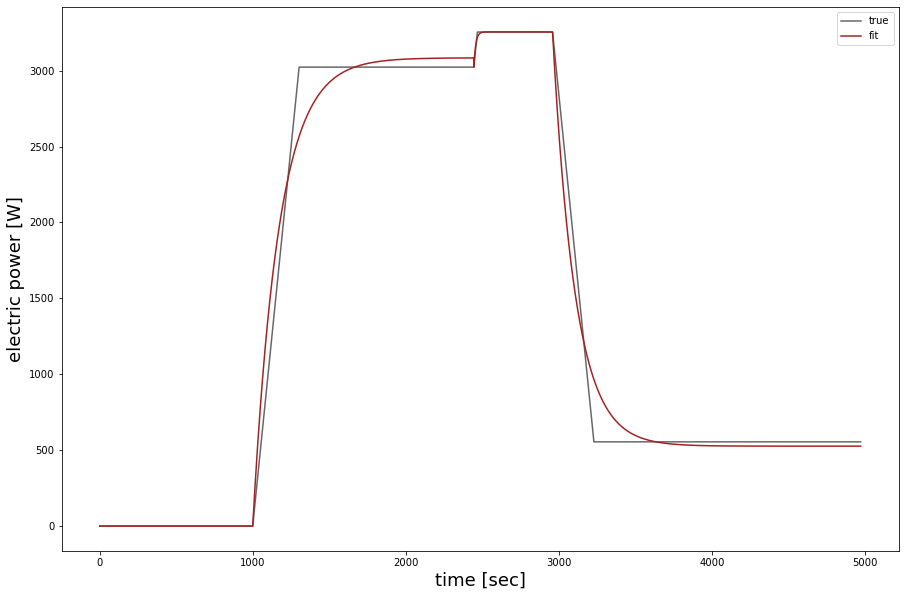

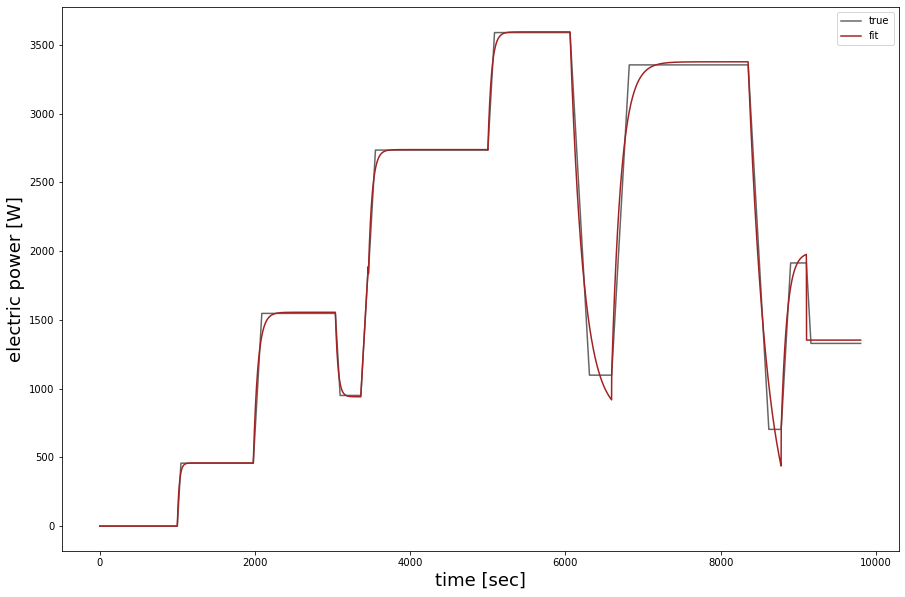

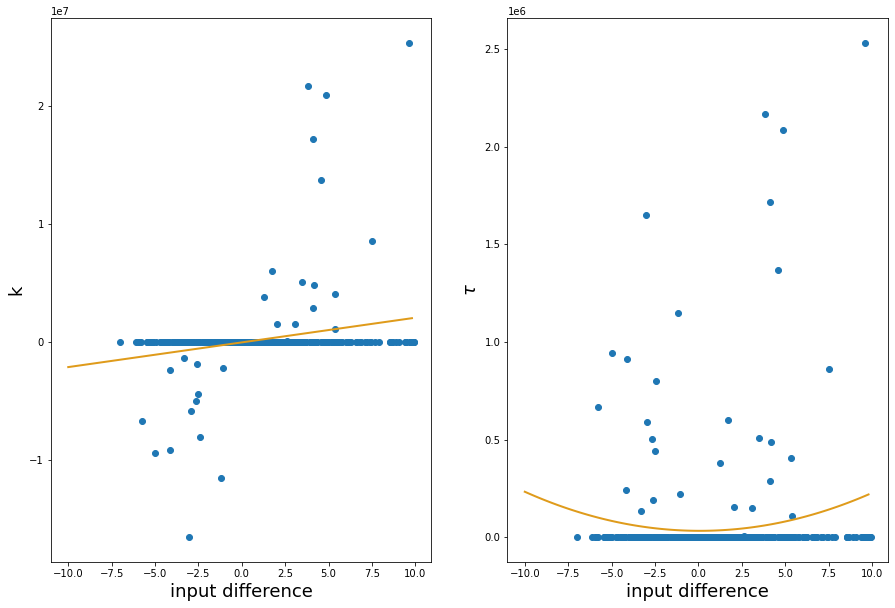

In [22]:
models_1 = train_meta_modell(ex_train, "train on " + train)

Our expert stated, that there are quadratic relationships between the outputs and the input so they might reflect on the parameters. The scatter plots suggest a quadratic relationship of tau to the difference and a linear relationship of k to the input difference.

## Prediction with fitted parameters 

In [23]:
def predict_other_experiment(model_parameters, data):
    start = time.time()
    time_splits = get_time_splits(data)
    data_time = data['time']
    data_input = data['input_voltage']
    
    #header = ['spin', 'el', 'th']
    header = ['el']
    durations = []
    
    for i in range(len(header)):
        parameters_k, parameters_tau = model_parameters[i]
        data_value = data[str(header[i] + '_power')]
        
        prm_k = np.empty(3)
        prm_tau = np.empty(3)
        prm_k[0], prm_k[1] = parameters_k
        prm_tau[0], prm_tau[1], prm_tau[2] = parameters_tau

        approximations = np.full(shape = len(data_time), fill_value= np.nan)

        for t in range(len(time_splits) -1):
            cut_point_prior = math.ceil(time_splits[t])
            cut_point_post = math.ceil(time_splits[t+1])
            time_segment = np.array(data_time[cut_point_prior:cut_point_post])
            value_segment = np.array(data_value[cut_point_prior:cut_point_post])
            input_start = data_input[cut_point_prior]
            input_end = data_input[cut_point_post -1]
            input_diff = input_end - input_start

            k = gf.linear_func(input_diff, prm_k[0], prm_k[1])
            tau = gf.quadr_func(input_diff, prm_tau[0], prm_tau[1], prm_tau[2])

            segment_approximation = gf.exp_func(time_segment-time_segment[0], k, tau) + value_segment[0]
            approximations[cut_point_prior:cut_point_post] = segment_approximation

        end = time.time()
        dur = end-start
        durations.append(dur)
        
        data[str(header[i] + '_predictions')] = approximations
    return data, durations

### On seen and unseen experiments

In [24]:
def compare_predictions(experiment, name, model_parameters, values = ['spin', 'el', 'th']):
    ex_predicted, durations = predict_other_experiment(model_parameters, experiment)
    

    all_results = []
    for n in values:
        fig, axs = plt.subplots(figsize = (15,10))
        line1, = axs.plot(experiment['time'], experiment[str(n +'_power')], color = gf.get_color('grey'), label = 'true', linewidth = 2)
        line2, = axs.plot(experiment['time'], experiment[str(n +'_predictions')], color = gf.get_color('green'), label = 'predictions', linewidth = 3)
        axs.set_title('Validation on ' + name, fontsize = 25)
        axs.set_xlabel('time [sec]', fontsize = 18)
        axs.set_ylabel('Electric power [W]' , fontsize = 18)
        axs.set_ylim([-50,4050])
        axs.legend([line1, line2], ['true', 'predictions'], loc = 'upper right', fontsize = 16)

        fig.savefig(image_folder + name + "_" + n + "_predictions.png")
        fig.savefig(image_folder + name + "_" + n + "_predictions.svg")
        
        print('-------------- Differences on ' + name + ' ' + n + ' predictions ----------------')
        results = gf.measure_difference(experiment[str(n + '_power')], experiment[str(n + '_predictions')])
        all_results.append(results['RMSE'])
    return all_results

-------------- Differences on 0_hand el predictions ----------------
The RMSE is 3403.460
The R2-score is -5.406
The MAE is 2387.545
The MaxAE is 11252.830
-------------- Differences on 2 el predictions ----------------
The RMSE is 9717.131
The R2-score is -138.775
The MAE is 6764.638
The MaxAE is 24261.764
-------------- Differences on 3 el predictions ----------------
The RMSE is 1966.120
The R2-score is -3.437
The MAE is 1262.285
The MaxAE is 6710.553
-------------- Differences on 4 el predictions ----------------
The RMSE is 4820.491
The R2-score is -25.759
The MAE is 3343.122
The MaxAE is 13274.359
-------------- Differences on 5 el predictions ----------------
The RMSE is 9541.616
The R2-score is -232.799
The MAE is 6593.861
The MaxAE is 23284.126
-------------- Differences on 6 el predictions ----------------
The RMSE is 7471.995
The R2-score is -126.433
The MAE is 5466.456
The MaxAE is 17005.545
-------------- Differences on 7 el predictions ----------------
The RMSE is 5836.01

<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 21 el predictions ----------------
The RMSE is 14618.734
The R2-score is -341.463
The MAE is 10252.617
The MaxAE is 33520.383


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 22 el predictions ----------------
The RMSE is 10477.762
The R2-score is -62.816
The MAE is 6784.188
The MaxAE is 31673.887


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 23 el predictions ----------------
The RMSE is 10806.348
The R2-score is -317.206
The MAE is 7548.611
The MaxAE is 29709.193


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 24 el predictions ----------------
The RMSE is 3910.174
The R2-score is -28.842
The MAE is 2316.102
The MaxAE is 15572.003


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 25 el predictions ----------------
The RMSE is 5452.838
The R2-score is -18.470
The MAE is 3204.600
The MaxAE is 17559.610


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 26 el predictions ----------------
The RMSE is 7286.474
The R2-score is -222.061
The MAE is 4892.865
The MaxAE is 22725.928


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 27 el predictions ----------------
The RMSE is 8678.580
The R2-score is -51.563
The MAE is 4952.582
The MaxAE is 28201.283


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 28 el predictions ----------------
The RMSE is 22785.119
The R2-score is -264.729
The MAE is 16470.499
The MaxAE is 50122.145


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 29 el predictions ----------------
The RMSE is 19979.749
The R2-score is -175.017
The MAE is 14048.268
The MaxAE is 48184.565


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 30 el predictions ----------------
The RMSE is 4665.620
The R2-score is -23.004
The MAE is 3336.562
The MaxAE is 14812.173


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 31 el predictions ----------------
The RMSE is 12417.560
The R2-score is -120.624
The MAE is 8819.603
The MaxAE is 34128.835


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 32 el predictions ----------------
The RMSE is 4658.618
The R2-score is -24.628
The MAE is 3421.143
The MaxAE is 14021.752


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 33 el predictions ----------------
The RMSE is 10451.450
The R2-score is -150.497
The MAE is 6766.606
The MaxAE is 29271.796


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 34 el predictions ----------------
The RMSE is 10742.172
The R2-score is -84.525
The MAE is 7669.104
The MaxAE is 28595.915


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 35 el predictions ----------------
The RMSE is 8559.262
The R2-score is -54.389
The MAE is 5914.461
The MaxAE is 24747.855


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 36 el predictions ----------------
The RMSE is 7601.184
The R2-score is -27.135
The MAE is 5348.480
The MaxAE is 19666.796


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 37 el predictions ----------------
The RMSE is 30014.365
The R2-score is -3727.880
The MAE is 22426.023
The MaxAE is 62035.542


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 38 el predictions ----------------
The RMSE is 15486.423
The R2-score is -222.834
The MAE is 12227.014
The MaxAE is 32631.386


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 39 el predictions ----------------
The RMSE is 5706.984
The R2-score is -109.778
The MAE is 4371.264
The MaxAE is 12396.254


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 40 el predictions ----------------
The RMSE is 9202.440
The R2-score is -76.744
The MAE is 6045.851
The MaxAE is 26279.840


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 41 el predictions ----------------
The RMSE is 14278.553
The R2-score is -293.399
The MAE is 10192.919
The MaxAE is 31145.788


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 42 el predictions ----------------
The RMSE is 8878.202
The R2-score is -43.573
The MAE is 5855.860
The MaxAE is 23802.036


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 43 el predictions ----------------
The RMSE is 6239.565
The R2-score is -182.914
The MAE is 4209.273
The MaxAE is 15829.629


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 44 el predictions ----------------
The RMSE is 16442.747
The R2-score is -552.864
The MAE is 9949.841
The MaxAE is 44316.675


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 45 el predictions ----------------
The RMSE is 7086.524
The R2-score is -47.731
The MAE is 4542.554
The MaxAE is 22499.462


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 46 el predictions ----------------
The RMSE is 7863.971
The R2-score is -488.208
The MAE is 4487.124
The MaxAE is 27437.403


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 47 el predictions ----------------
The RMSE is 5008.836
The R2-score is -20.825
The MAE is 3380.167
The MaxAE is 12606.445


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 48 el predictions ----------------
The RMSE is 11498.537
The R2-score is -85.838
The MAE is 6977.429
The MaxAE is 33799.483


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 49 el predictions ----------------
The RMSE is 8537.989
The R2-score is -41.967
The MAE is 5575.339
The MaxAE is 22755.238


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 50 el predictions ----------------
The RMSE is 6179.042
The R2-score is -24.822
The MAE is 4220.725
The MaxAE is 20041.667


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 51 el predictions ----------------
The RMSE is 10256.641
The R2-score is -102.876
The MAE is 6382.999
The MaxAE is 31517.381


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 52 el predictions ----------------
The RMSE is 30060.108
The R2-score is -1710.680
The MAE is 20161.316
The MaxAE is 68207.609


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 53 el predictions ----------------
The RMSE is 11807.387
The R2-score is -158.405
The MAE is 8129.813
The MaxAE is 31796.378


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 54 el predictions ----------------
The RMSE is 20298.558
The R2-score is -365.934
The MAE is 13929.082
The MaxAE is 49344.913


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 55 el predictions ----------------
The RMSE is 13322.899
The R2-score is -131.584
The MAE is 9032.951
The MaxAE is 36072.105


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 56 el predictions ----------------
The RMSE is 11541.481
The R2-score is -66.837
The MAE is 8262.051
The MaxAE is 26601.821


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 57 el predictions ----------------
The RMSE is 13082.644
The R2-score is -86.577
The MAE is 9386.452
The MaxAE is 30579.970


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 58 el predictions ----------------
The RMSE is 2845.987
The R2-score is -10.247
The MAE is 2077.114
The MaxAE is 9184.342


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 59 el predictions ----------------
The RMSE is 6939.341
The R2-score is -42.407
The MAE is 3886.172
The MaxAE is 23613.775


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 60 el predictions ----------------
The RMSE is 17088.386
The R2-score is -325.237
The MAE is 12175.018
The MaxAE is 43387.084


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 61 el predictions ----------------
The RMSE is 7714.519
The R2-score is -40.511
The MAE is 5031.978
The MaxAE is 21145.544


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 62 el predictions ----------------
The RMSE is 2750.886
The R2-score is -6.091
The MAE is 1583.851
The MaxAE is 10522.696


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 63 el predictions ----------------
The RMSE is 14250.108
The R2-score is -212.495
The MAE is 9604.223
The MaxAE is 36055.985


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 64 el predictions ----------------
The RMSE is 7041.253
The R2-score is -177.389
The MAE is 4761.466
The MaxAE is 20302.283


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 65 el predictions ----------------
The RMSE is 9690.878
The R2-score is -149.549
The MAE is 5358.497
The MaxAE is 30903.996


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 66 el predictions ----------------
The RMSE is 29284.911
The R2-score is -696.769
The MAE is 20770.273
The MaxAE is 66385.096


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 67 el predictions ----------------
The RMSE is 20348.473
The R2-score is -1373.923
The MAE is 13237.031
The MaxAE is 50328.649


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 68 el predictions ----------------
The RMSE is 7568.778
The R2-score is -41.999
The MAE is 5348.661
The MaxAE is 19785.216


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 69 el predictions ----------------
The RMSE is 13934.084
The R2-score is -454.534
The MAE is 8406.491
The MaxAE is 37888.898


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 70 el predictions ----------------
The RMSE is 7290.215
The R2-score is -62.959
The MAE is 4809.511
The MaxAE is 22032.354


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 71 el predictions ----------------
The RMSE is 10264.424
The R2-score is -56.984
The MAE is 6715.008
The MaxAE is 31269.086


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 72 el predictions ----------------
The RMSE is 5247.118
The R2-score is -16.835
The MAE is 3506.336
The MaxAE is 14726.197


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 73 el predictions ----------------
The RMSE is 7110.894
The R2-score is -43.549
The MAE is 5235.421
The MaxAE is 19489.855


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 74 el predictions ----------------
The RMSE is 7529.317
The R2-score is -47.854
The MAE is 5130.734
The MaxAE is 21498.885


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 75 el predictions ----------------
The RMSE is 12885.637
The R2-score is -96.604
The MAE is 8346.133
The MaxAE is 34605.718


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 76 el predictions ----------------
The RMSE is 13096.868
The R2-score is -295.788
The MAE is 7755.721
The MaxAE is 38624.561


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 77 el predictions ----------------
The RMSE is 10330.139
The R2-score is -188.999
The MAE is 7116.308
The MaxAE is 30136.688


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 78 el predictions ----------------
The RMSE is 22756.041
The R2-score is -587.660
The MAE is 15355.352
The MaxAE is 53934.696


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 79 el predictions ----------------
The RMSE is 10742.446
The R2-score is -4282.841
The MAE is 7765.933
The MaxAE is 31572.142


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 80 el predictions ----------------
The RMSE is 11188.308
The R2-score is -842.694
The MAE is 7851.058
The MaxAE is 28485.228


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 81 el predictions ----------------
The RMSE is 10214.287
The R2-score is -47.994
The MAE is 7207.571
The MaxAE is 24815.208


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 82 el predictions ----------------
The RMSE is 16063.402
The R2-score is -162.086
The MAE is 11208.102
The MaxAE is 39727.990


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 83 el predictions ----------------
The RMSE is 7747.637
The R2-score is -61.432
The MAE is 5383.889
The MaxAE is 21030.857


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 84 el predictions ----------------
The RMSE is 11711.598
The R2-score is -99.487
The MAE is 8407.163
The MaxAE is 30278.096


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 85 el predictions ----------------
The RMSE is 3247.847
The R2-score is -54.446
The MAE is 2334.788
The MaxAE is 10686.289


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 86 el predictions ----------------
The RMSE is 5648.029
The R2-score is -56.718
The MAE is 4063.941
The MaxAE is 12979.035


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 87 el predictions ----------------
The RMSE is 3293.851
The R2-score is -5.074
The MAE is 2168.854
The MaxAE is 11032.677


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 88 el predictions ----------------
The RMSE is 12719.949
The R2-score is -230.063
The MAE is 8321.741
The MaxAE is 37542.367


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 89 el predictions ----------------
The RMSE is 15210.303
The R2-score is -1064.502
The MAE is 11986.525
The MaxAE is 32359.668


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 90 el predictions ----------------
The RMSE is 19963.052
The R2-score is -206.555
The MAE is 14577.703
The MaxAE is 44062.173


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 91 el predictions ----------------
The RMSE is 11092.257
The R2-score is -81.103
The MAE is 8414.603
The MaxAE is 24691.000


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 92 el predictions ----------------
The RMSE is 12816.262
The R2-score is -236.963
The MAE is 9264.771
The MaxAE is 31816.199


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 93 el predictions ----------------
The RMSE is 9071.589
The R2-score is -162.988
The MAE is 7026.398
The MaxAE is 20744.040


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 94 el predictions ----------------
The RMSE is 12529.030
The R2-score is -200.812
The MAE is 8114.349
The MaxAE is 33559.444


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 95 el predictions ----------------
The RMSE is 6554.990
The R2-score is -32.093
The MAE is 4527.626
The MaxAE is 16955.668


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 96 el predictions ----------------
The RMSE is 5382.041
The R2-score is -24.514
The MAE is 3534.040
The MaxAE is 17207.290


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 97 el predictions ----------------
The RMSE is 16387.376
The R2-score is -196.453
The MAE is 10649.272
The MaxAE is 41609.085


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 98 el predictions ----------------
The RMSE is 9610.550
The R2-score is -117.251
The MAE is 6835.515
The MaxAE is 23365.190


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 99 el predictions ----------------
The RMSE is 4125.154
The R2-score is -12.311
The MAE is 3034.501
The MaxAE is 13564.041


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 100 el predictions ----------------
The RMSE is 8727.589
The R2-score is -68.310
The MAE is 5793.200
The MaxAE is 26014.282


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 101 el predictions ----------------
The RMSE is 3957.916
The R2-score is -7.666
The MAE is 2848.006
The MaxAE is 9799.909


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 102 el predictions ----------------
The RMSE is 5388.552
The R2-score is -25.342
The MAE is 3380.990
The MaxAE is 15820.638


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 103 el predictions ----------------
The RMSE is 7282.828
The R2-score is -36.358
The MAE is 5051.451
The MaxAE is 21611.072


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 104 el predictions ----------------
The RMSE is 20998.599
The R2-score is -716.044
The MAE is 16098.869
The MaxAE is 43224.654


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 105 el predictions ----------------
The RMSE is 24795.469
The R2-score is -279.124
The MAE is 18751.184
The MaxAE is 55803.702


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 106 el predictions ----------------
The RMSE is 6248.116
The R2-score is -51.294
The MAE is 4212.201
The MaxAE is 15043.968


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 107 el predictions ----------------
The RMSE is 16916.207
The R2-score is -108.307
The MAE is 11102.249
The MaxAE is 42146.477


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 108 el predictions ----------------
The RMSE is 12663.256
The R2-score is -229.382
The MAE is 8813.585
The MaxAE is 34254.792


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 109 el predictions ----------------
The RMSE is 3970.783
The R2-score is -49.705
The MAE is 2899.031
The MaxAE is 10480.112


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 110 el predictions ----------------
The RMSE is 9051.020
The R2-score is -75.590
The MAE is 5735.968
The MaxAE is 25620.904


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 111 el predictions ----------------
The RMSE is 15563.140
The R2-score is -251.845
The MAE is 11606.333
The MaxAE is 33936.331


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 112 el predictions ----------------
The RMSE is 5371.740
The R2-score is -24.201
The MAE is 3604.236
The MaxAE is 13683.205


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 113 el predictions ----------------
The RMSE is 7449.511
The R2-score is -36.719
The MAE is 4168.385
The MaxAE is 24167.780


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 114 el predictions ----------------
The RMSE is 9274.587
The R2-score is -178.156
The MAE is 6327.000
The MaxAE is 27476.566


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 115 el predictions ----------------
The RMSE is 19503.224
The R2-score is -147.313
The MAE is 14003.059
The MaxAE is 47136.270


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 116 el predictions ----------------
The RMSE is 6433.030
The R2-score is -58.268
The MAE is 3548.245
The MaxAE is 20042.902


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 117 el predictions ----------------
The RMSE is 10417.931
The R2-score is -196.220
The MAE is 7147.665
The MaxAE is 28059.966


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 118 el predictions ----------------
The RMSE is 9430.255
The R2-score is -68.992
The MAE is 6523.608
The MaxAE is 25190.756


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 119 el predictions ----------------
The RMSE is 8586.067
The R2-score is -49.822
The MAE is 5997.557
The MaxAE is 22217.415


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 120 el predictions ----------------
The RMSE is 18365.810
The R2-score is -2598.795
The MAE is 14284.123
The MaxAE is 39838.903


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 121 el predictions ----------------
The RMSE is 16437.955
The R2-score is -187.492
The MAE is 11350.407
The MaxAE is 43599.171


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 122 el predictions ----------------
The RMSE is 29209.347
The R2-score is -6516.103
The MAE is 21126.250
The MaxAE is 61148.764


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 123 el predictions ----------------
The RMSE is 11743.681
The R2-score is -106.748
The MAE is 8202.257
The MaxAE is 27604.915


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 124 el predictions ----------------
The RMSE is 16355.255
The R2-score is -148.907
The MAE is 11669.645
The MaxAE is 42278.929


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 125 el predictions ----------------
The RMSE is 7274.213
The R2-score is -99.957
The MAE is 4739.537
The MaxAE is 22517.431


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 126 el predictions ----------------
The RMSE is 27242.739
The R2-score is -491.316
The MAE is 20336.855
The MaxAE is 57903.773


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 127 el predictions ----------------
The RMSE is 12815.440
The R2-score is -168.811
The MAE is 8689.079
The MaxAE is 32438.279


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 128 el predictions ----------------
The RMSE is 17064.742
The R2-score is -277.499
The MAE is 11957.056
The MaxAE is 40994.656


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 129 el predictions ----------------
The RMSE is 16684.697
The R2-score is -493.409
The MAE is 11339.437
The MaxAE is 42926.376


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 130 el predictions ----------------
The RMSE is 9873.968
The R2-score is -136.312
The MAE is 6846.653
The MaxAE is 25624.763


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 131 el predictions ----------------
The RMSE is 4541.175
The R2-score is -40.942
The MAE is 3290.827
The MaxAE is 12559.045


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 132 el predictions ----------------
The RMSE is 7050.155
The R2-score is -30.104
The MAE is 4365.693
The MaxAE is 19818.925


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 133 el predictions ----------------
The RMSE is 4839.954
The R2-score is -12.520
The MAE is 3065.415
The MaxAE is 15113.880


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 134 el predictions ----------------
The RMSE is 10778.444
The R2-score is -366.625
The MAE is 8376.887
The MaxAE is 25329.935


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 135 el predictions ----------------
The RMSE is 11774.656
The R2-score is -1293.482
The MAE is 8690.960
The MaxAE is 33098.089


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 136 el predictions ----------------
The RMSE is 20567.966
The R2-score is -343.678
The MAE is 14255.628
The MaxAE is 50899.689


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 137 el predictions ----------------
The RMSE is 12970.379
The R2-score is -113.432
The MAE is 9640.811
The MaxAE is 29270.084


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 138 el predictions ----------------
The RMSE is 5883.450
The R2-score is -26.547
The MAE is 4028.687
The MaxAE is 18625.717


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 139 el predictions ----------------
The RMSE is 3343.945
The R2-score is -6.347
The MAE is 2330.748
The MaxAE is 11540.573


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 140 el predictions ----------------
The RMSE is 7579.509
The R2-score is -57.882
The MAE is 4540.999
The MaxAE is 24591.786


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 141 el predictions ----------------
The RMSE is 12419.574
The R2-score is -82.948
The MAE is 8313.460
The MaxAE is 35165.520


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 142 el predictions ----------------
The RMSE is 3697.333
The R2-score is -10.801
The MAE is 2296.933
The MaxAE is 13000.704


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 143 el predictions ----------------
The RMSE is 8121.805
The R2-score is -53.990
The MAE is 4552.636
The MaxAE is 27357.829


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 144 el predictions ----------------
The RMSE is 6110.405
The R2-score is -32.093
The MAE is 3641.417
The MaxAE is 21789.892


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 145 el predictions ----------------
The RMSE is 9670.124
The R2-score is -313.455
The MAE is 7640.619
The MaxAE is 21902.810


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 146 el predictions ----------------
The RMSE is 30460.885
The R2-score is -1980.599
The MAE is 21347.986
The MaxAE is 66563.274


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 147 el predictions ----------------
The RMSE is 17325.910
The R2-score is -158.463
The MAE is 13242.485
The MaxAE is 35108.863


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 148 el predictions ----------------
The RMSE is 8910.473
The R2-score is -72.627
The MAE is 5933.490
The MaxAE is 22330.005


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 149 el predictions ----------------
The RMSE is 4817.562
The R2-score is -15.017
The MAE is 3406.451
The MaxAE is 13905.741


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 150 el predictions ----------------
The RMSE is 20581.002
The R2-score is -245.625
The MAE is 14988.358
The MaxAE is 49403.557


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 151 el predictions ----------------
The RMSE is 12072.541
The R2-score is -186.987
The MAE is 8650.274
The MaxAE is 30418.413


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 152 el predictions ----------------
The RMSE is 6902.151
The R2-score is -33.286
The MAE is 4673.375
The MaxAE is 20223.774


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 153 el predictions ----------------
The RMSE is 7316.494
The R2-score is -45.835
The MAE is 4838.879
The MaxAE is 20418.295


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 154 el predictions ----------------
The RMSE is 6631.176
The R2-score is -52.715
The MAE is 4438.548
The MaxAE is 18700.512


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 155 el predictions ----------------
The RMSE is 16827.471
The R2-score is -1571.684
The MAE is 10810.052
The MaxAE is 45399.302


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 156 el predictions ----------------
The RMSE is 18701.892
The R2-score is -534.302
The MAE is 12613.663
The MaxAE is 47723.969


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 157 el predictions ----------------
The RMSE is 19302.066
The R2-score is -1464.985
The MAE is 13608.934
The MaxAE is 49147.503


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 158 el predictions ----------------
The RMSE is 15457.326
The R2-score is -189.989
The MAE is 10459.137
The MaxAE is 39153.958


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 159 el predictions ----------------
The RMSE is 12281.205
The R2-score is -416.260
The MAE is 9684.564
The MaxAE is 26148.240


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 160 el predictions ----------------
The RMSE is 13508.559
The R2-score is -216.197
The MAE is 8715.111
The MaxAE is 38096.892


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 161 el predictions ----------------
The RMSE is 6534.093
The R2-score is -101.096
The MAE is 4516.650
The MaxAE is 20518.454


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 162 el predictions ----------------
The RMSE is 12831.161
The R2-score is -343.588
The MAE is 9251.781
The MaxAE is 32123.473


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 163 el predictions ----------------
The RMSE is 4056.839
The R2-score is -18.514
The MAE is 2793.803
The MaxAE is 11817.770


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 164 el predictions ----------------
The RMSE is 12766.718
The R2-score is -132.122
The MAE is 8810.526
The MaxAE is 33798.971


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 165 el predictions ----------------
The RMSE is 11665.371
The R2-score is -97.131
The MAE is 8840.138
The MaxAE is 28312.259


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 166 el predictions ----------------
The RMSE is 5298.487
The R2-score is -32.088
The MAE is 4072.137
The MaxAE is 10810.615


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 167 el predictions ----------------
The RMSE is 10240.193
The R2-score is -46.851
The MAE is 6337.950
The MaxAE is 28157.587


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 168 el predictions ----------------
The RMSE is 4810.068
The R2-score is -29.208
The MAE is 3429.293
The MaxAE is 12103.007


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 169 el predictions ----------------
The RMSE is 23492.803
The R2-score is -1111.679
The MAE is 16956.559
The MaxAE is 53825.619


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 170 el predictions ----------------
The RMSE is 5933.320
The R2-score is -43.279
The MAE is 3872.687
The MaxAE is 17399.859


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 171 el predictions ----------------
The RMSE is 18644.890
The R2-score is -227.233
The MAE is 12744.298
The MaxAE is 47154.672


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 172 el predictions ----------------
The RMSE is 16502.511
The R2-score is -161.609
The MAE is 11763.791
The MaxAE is 39011.721


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 173 el predictions ----------------
The RMSE is 6589.966
The R2-score is -20.059
The MAE is 5017.237
The MaxAE is 15506.751


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 174 el predictions ----------------
The RMSE is 20674.128
The R2-score is -417.143
The MAE is 15047.206
The MaxAE is 47360.560


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 175 el predictions ----------------
The RMSE is 20007.178
The R2-score is -285.913
The MAE is 14565.137
The MaxAE is 46684.588


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 176 el predictions ----------------
The RMSE is 13511.593
The R2-score is -514.399
The MAE is 10057.727
The MaxAE is 31451.742


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 177 el predictions ----------------
The RMSE is 8767.487
The R2-score is -32.131
The MAE is 5780.714
The MaxAE is 25676.051


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 178 el predictions ----------------
The RMSE is 2964.715
The R2-score is -21.845
The MAE is 2214.553
The MaxAE is 7973.238


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 179 el predictions ----------------
The RMSE is 9121.528
The R2-score is -77.521
The MAE is 6571.094
The MaxAE is 23811.588


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 180 el predictions ----------------
The RMSE is 5208.535
The R2-score is -35.101
The MAE is 3376.373
The MaxAE is 16600.812


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 181 el predictions ----------------
The RMSE is 4844.402
The R2-score is -26.299
The MAE is 3339.131
The MaxAE is 14509.158


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 182 el predictions ----------------
The RMSE is 15313.664
The R2-score is -186.149
The MAE is 10987.499
The MaxAE is 39500.459


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 183 el predictions ----------------
The RMSE is 9080.139
The R2-score is -45.025
The MAE is 6712.804
The MaxAE is 22521.195


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 184 el predictions ----------------
The RMSE is 18664.968
The R2-score is -980.036
The MAE is 13618.589
The MaxAE is 45330.836


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 185 el predictions ----------------
The RMSE is 5777.438
The R2-score is -29.735
The MAE is 4195.517
The MaxAE is 14578.877


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 186 el predictions ----------------
The RMSE is 9867.660
The R2-score is -120.563
The MAE is 6913.294
The MaxAE is 26926.406


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 187 el predictions ----------------
The RMSE is 4319.180
The R2-score is -35.164
The MAE is 2380.083
The MaxAE is 14357.027


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 188 el predictions ----------------
The RMSE is 27974.864
The R2-score is -985.406
The MAE is 20156.226
The MaxAE is 59155.082


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 189 el predictions ----------------
The RMSE is 13032.436
The R2-score is -169.427
The MAE is 9519.333
The MaxAE is 34764.861


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 190 el predictions ----------------
The RMSE is 5561.417
The R2-score is -33.897
The MAE is 4286.775
The MaxAE is 12180.766


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 191 el predictions ----------------
The RMSE is 16622.142
The R2-score is -946.175
The MAE is 12352.381
The MaxAE is 37387.834


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 192 el predictions ----------------
The RMSE is 5249.464
The R2-score is -14.756
The MAE is 3555.917
The MaxAE is 17895.493


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 193 el predictions ----------------
The RMSE is 6284.058
The R2-score is -20.819
The MAE is 4392.440
The MaxAE is 16644.802


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 194 el predictions ----------------
The RMSE is 5962.049
The R2-score is -35.746
The MAE is 4285.386
The MaxAE is 13831.454


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 195 el predictions ----------------
The RMSE is 21463.567
The R2-score is -414.387
The MAE is 13580.917
The MaxAE is 52448.029


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 196 el predictions ----------------
The RMSE is 2615.989
The R2-score is -9.759
The MAE is 1916.458
The MaxAE is 8830.390


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 197 el predictions ----------------
The RMSE is 14867.512
The R2-score is -117.964
The MAE is 9546.786
The MaxAE is 39368.993


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 198 el predictions ----------------
The RMSE is 13763.775
The R2-score is -247.553
The MAE is 9770.931
The MaxAE is 36979.540


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 199 el predictions ----------------
The RMSE is 17077.201
The R2-score is -383.963
The MAE is 12390.745
The MaxAE is 40867.527


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 200 el predictions ----------------
The RMSE is 5543.208
The R2-score is -71.308
The MAE is 4015.368
The MaxAE is 16775.970


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 201 el predictions ----------------
The RMSE is 17098.822
The R2-score is -1017.876
The MAE is 10990.511
The MaxAE is 45120.006


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 202 el predictions ----------------
The RMSE is 18600.571
The R2-score is -219.007
The MAE is 14198.077
The MaxAE is 38281.432


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 203 el predictions ----------------
The RMSE is 5310.968
The R2-score is -73.284
The MAE is 3593.980
The MaxAE is 15098.293


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 204 el predictions ----------------
The RMSE is 14868.672
The R2-score is -102.147
The MAE is 9117.111
The MaxAE is 40864.106


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 205 el predictions ----------------
The RMSE is 7670.550
The R2-score is -36.316
The MAE is 4769.516
The MaxAE is 24119.281


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 206 el predictions ----------------
The RMSE is 17404.538
The R2-score is -222.414
The MAE is 13334.247
The MaxAE is 34851.218


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 207 el predictions ----------------
The RMSE is 8107.693
The R2-score is -38.411
The MAE is 5070.066
The MaxAE is 22518.034


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 208 el predictions ----------------
The RMSE is 9069.292
The R2-score is -50.423
The MAE is 6007.589
The MaxAE is 28345.392


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 209 el predictions ----------------
The RMSE is 9696.462
The R2-score is -110.945
The MAE is 6135.813
The MaxAE is 27972.022


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 210 el predictions ----------------
The RMSE is 14945.486
The R2-score is -221.458
The MAE is 11386.962
The MaxAE is 33095.014


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 211 el predictions ----------------
The RMSE is 12679.411
The R2-score is -100.682
The MAE is 9552.544
The MaxAE is 29483.012


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 212 el predictions ----------------
The RMSE is 35602.650
The R2-score is -1475.751
The MAE is 26267.047
The MaxAE is 73517.436


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 213 el predictions ----------------
The RMSE is 20990.468
The R2-score is -195.332
The MAE is 15185.498
The MaxAE is 48038.404


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 214 el predictions ----------------
The RMSE is 19545.327
The R2-score is -430.580
The MAE is 12176.111
The MaxAE is 50829.555


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 215 el predictions ----------------
The RMSE is 12626.244
The R2-score is -166.429
The MAE is 9042.167
The MaxAE is 28662.146


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 216 el predictions ----------------
The RMSE is 9930.565
The R2-score is -40.791
The MAE is 6526.272
The MaxAE is 25999.459


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 217 el predictions ----------------
The RMSE is 8741.776
The R2-score is -77.644
The MAE is 5606.604
The MaxAE is 27639.306


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 218 el predictions ----------------
The RMSE is 11832.389
The R2-score is -82.324
The MAE is 8100.495
The MaxAE is 29841.093


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 219 el predictions ----------------
The RMSE is 15317.928
The R2-score is -195.947
The MAE is 11042.903
The MaxAE is 36867.543


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 220 el predictions ----------------
The RMSE is 12585.610
The R2-score is -89.980
The MAE is 9253.625
The MaxAE is 29397.193


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 221 el predictions ----------------
The RMSE is 7361.525
The R2-score is -133.411
The MAE is 4073.003
The MaxAE is 25580.298


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 222 el predictions ----------------
The RMSE is 34109.912
The R2-score is -983.963
The MAE is 24983.845
The MaxAE is 73061.964


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 223 el predictions ----------------
The RMSE is 10853.459
The R2-score is -107.938
The MAE is 7081.920
The MaxAE is 31001.663


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 224 el predictions ----------------
The RMSE is 8198.251
The R2-score is -38.165
The MAE is 5867.962
The MaxAE is 20291.523


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 225 el predictions ----------------
The RMSE is 7500.856
The R2-score is -128.913
The MAE is 4954.065
The MaxAE is 21351.575


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 226 el predictions ----------------
The RMSE is 13471.349
The R2-score is -198.401
The MAE is 8945.100
The MaxAE is 36472.977


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 227 el predictions ----------------
The RMSE is 12050.706
The R2-score is -140.285
The MAE is 9629.053
The MaxAE is 26644.316


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 228 el predictions ----------------
The RMSE is 5306.450
The R2-score is -27.223
The MAE is 3738.309
The MaxAE is 15581.821


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 229 el predictions ----------------
The RMSE is 22388.960
The R2-score is -500.591
The MAE is 17142.797
The MaxAE is 49789.154


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 230 el predictions ----------------
The RMSE is 11818.903
The R2-score is -122.190
The MAE is 7908.231
The MaxAE is 34276.249


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 231 el predictions ----------------
The RMSE is 11847.538
The R2-score is -92.958
The MAE is 7930.238
The MaxAE is 32351.733


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 232 el predictions ----------------
The RMSE is 11135.135
The R2-score is -89.876
The MAE is 7484.576
The MaxAE is 29552.457


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 233 el predictions ----------------
The RMSE is 3768.545
The R2-score is -12.875
The MAE is 2657.298
The MaxAE is 13305.912


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 234 el predictions ----------------
The RMSE is 17355.034
The R2-score is -272.491
The MAE is 13387.670
The MaxAE is 40102.656


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 235 el predictions ----------------
The RMSE is 6990.958
The R2-score is -28.507
The MAE is 4148.989
The MaxAE is 23235.627


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 236 el predictions ----------------
The RMSE is 12995.704
The R2-score is -528.802
The MAE is 7974.081
The MaxAE is 36943.371


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 237 el predictions ----------------
The RMSE is 19883.325
The R2-score is -711.137
The MAE is 13051.145
The MaxAE is 47921.219


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 238 el predictions ----------------
The RMSE is 18603.811
The R2-score is -1087.294
The MAE is 13760.238
The MaxAE is 38972.237


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 239 el predictions ----------------
The RMSE is 9541.641
The R2-score is -98.853
The MAE is 6994.710
The MaxAE is 24534.977


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 240 el predictions ----------------
The RMSE is 13225.626
The R2-score is -95.905
The MAE is 9530.061
The MaxAE is 32044.606


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 241 el predictions ----------------
The RMSE is 10921.231
The R2-score is -97.695
The MAE is 7296.909
The MaxAE is 28188.714


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 242 el predictions ----------------
The RMSE is 11168.976
The R2-score is -455.236
The MAE is 8071.828
The MaxAE is 29696.312


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 243 el predictions ----------------
The RMSE is 5629.385
The R2-score is -59.334
The MAE is 3915.794
The MaxAE is 15767.311


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 244 el predictions ----------------
The RMSE is 14333.616
The R2-score is -195.253
The MAE is 10374.428
The MaxAE is 34886.562


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 245 el predictions ----------------
The RMSE is 12195.814
The R2-score is -139.447
The MAE is 9093.702
The MaxAE is 29901.685


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 246 el predictions ----------------
The RMSE is 5729.842
The R2-score is -154.935
The MAE is 3925.864
The MaxAE is 16029.080


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 247 el predictions ----------------
The RMSE is 11254.968
The R2-score is -152.113
The MAE is 6970.012
The MaxAE is 34592.453


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 248 el predictions ----------------
The RMSE is 3842.968
The R2-score is -22.959
The MAE is 2550.871
The MaxAE is 12347.871


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 249 el predictions ----------------
The RMSE is 5721.022
The R2-score is -22.347
The MAE is 3962.325
The MaxAE is 15810.708


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 250 el predictions ----------------
The RMSE is 18594.429
The R2-score is -359.982
The MAE is 12265.969
The MaxAE is 45415.716


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 251 el predictions ----------------
The RMSE is 13257.439
The R2-score is -90.045
The MAE is 8801.896
The MaxAE is 37154.868


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 252 el predictions ----------------
The RMSE is 5421.531
The R2-score is -20.743
The MAE is 3787.708
The MaxAE is 15169.193


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 253 el predictions ----------------
The RMSE is 8196.541
The R2-score is -115.494
The MAE is 4781.899
The MaxAE is 25113.444


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 254 el predictions ----------------
The RMSE is 34959.349
The R2-score is -1256.594
The MAE is 25172.186
The MaxAE is 74656.025


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 255 el predictions ----------------
The RMSE is 4549.232
The R2-score is -39.466
The MAE is 3212.224
The MaxAE is 14460.960


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 256 el predictions ----------------
The RMSE is 12099.408
The R2-score is -387.623
The MAE is 9488.933
The MaxAE is 26533.768


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 257 el predictions ----------------
The RMSE is 38961.151
The R2-score is -11073.540
The MAE is 28616.077
The MaxAE is 81221.478


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 258 el predictions ----------------
The RMSE is 8259.679
The R2-score is -145.617
The MAE is 5817.741
The MaxAE is 22104.696


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 259 el predictions ----------------
The RMSE is 19469.122
The R2-score is -236.834
The MAE is 14749.849
The MaxAE is 40981.064


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 260 el predictions ----------------
The RMSE is 49514.571
The R2-score is -5328.749
The MAE is 39250.506
The MaxAE is 92635.092


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 261 el predictions ----------------
The RMSE is 13363.934
The R2-score is -358.997
The MAE is 9149.117
The MaxAE is 37424.517


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 262 el predictions ----------------
The RMSE is 10085.051
The R2-score is -45.154
The MAE is 6345.807
The MaxAE is 29460.223


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 263 el predictions ----------------
The RMSE is 6471.335
The R2-score is -25.300
The MAE is 4412.491
The MaxAE is 17654.488


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 264 el predictions ----------------
The RMSE is 3185.532
The R2-score is -5.730
The MAE is 2233.304
The MaxAE is 7918.896


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 265 el predictions ----------------
The RMSE is 15540.182
The R2-score is -233.733
The MAE is 10257.942
The MaxAE is 40444.882


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 266 el predictions ----------------
The RMSE is 7015.825
The R2-score is -44.741
The MAE is 5170.349
The MaxAE is 17671.231


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 267 el predictions ----------------
The RMSE is 5090.159
The R2-score is -13.270
The MAE is 3346.964
The MaxAE is 15440.460


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 268 el predictions ----------------
The RMSE is 15405.188
The R2-score is -265.900
The MAE is 10413.423
The MaxAE is 39025.805


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 269 el predictions ----------------
The RMSE is 13311.520
The R2-score is -178.656
The MAE is 8346.253
The MaxAE is 36527.275


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 270 el predictions ----------------
The RMSE is 16748.439
The R2-score is -382.277
The MAE is 11889.729
The MaxAE is 41426.778


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 271 el predictions ----------------
The RMSE is 7283.930
The R2-score is -858.630
The MAE is 4986.158
The MaxAE is 21512.151


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 272 el predictions ----------------
The RMSE is 1283.036
The R2-score is -4.351
The MAE is 756.734
The MaxAE is 6336.476


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 273 el predictions ----------------
The RMSE is 6313.816
The R2-score is -53.508
The MAE is 3799.953
The MaxAE is 22844.639


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 274 el predictions ----------------
The RMSE is 7500.017
The R2-score is -35.672
The MAE is 4622.007
The MaxAE is 25428.268


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 275 el predictions ----------------
The RMSE is 4777.634
The R2-score is -19.503
The MAE is 3272.690
The MaxAE is 12038.347


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 276 el predictions ----------------
The RMSE is 8002.214
The R2-score is -45.937
The MAE is 4545.920
The MaxAE is 26586.147


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 277 el predictions ----------------
The RMSE is 12359.618
The R2-score is -144.540
The MAE is 8518.599
The MaxAE is 31752.919


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 278 el predictions ----------------
The RMSE is 6907.809
The R2-score is -26.915
The MAE is 4666.957
The MaxAE is 21837.827


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 279 el predictions ----------------
The RMSE is 9359.930
The R2-score is -80.340
The MAE is 6762.556
The MaxAE is 26936.555


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 280 el predictions ----------------
The RMSE is 5755.967
The R2-score is -135.681
The MAE is 4030.851
The MaxAE is 17992.658


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 281 el predictions ----------------
The RMSE is 2679.614
The R2-score is -6.759
The MAE is 1545.551
The MaxAE is 11292.231


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 282 el predictions ----------------
The RMSE is 21805.826
The R2-score is -733.129
The MAE is 16051.287
The MaxAE is 51293.608


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 283 el predictions ----------------
The RMSE is 5572.793
The R2-score is -32.459
The MAE is 3843.682
The MaxAE is 17096.263


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 284 el predictions ----------------
The RMSE is 9101.911
The R2-score is -125.678
The MAE is 7262.803
The MaxAE is 21664.221


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 285 el predictions ----------------
The RMSE is 5298.635
The R2-score is -22.094
The MAE is 3463.203
The MaxAE is 18201.494


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 286 el predictions ----------------
The RMSE is 11010.264
The R2-score is -941.711
The MAE is 8243.803
The MaxAE is 23118.147


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 287 el predictions ----------------
The RMSE is 4058.608
The R2-score is -10.314
The MAE is 2977.322
The MaxAE is 11535.577


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 288 el predictions ----------------
The RMSE is 7326.329
The R2-score is -262.786
The MAE is 5212.981
The MaxAE is 18613.873


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 289 el predictions ----------------
The RMSE is 7627.555
The R2-score is -34.396
The MAE is 4819.083
The MaxAE is 25583.050


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 290 el predictions ----------------
The RMSE is 4649.607
The R2-score is -23.657
The MAE is 2752.288
The MaxAE is 16634.355


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 291 el predictions ----------------
The RMSE is 3611.004
The R2-score is -16.000
The MAE is 2389.364
The MaxAE is 13323.596


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 292 el predictions ----------------
The RMSE is 24120.673
The R2-score is -2173.414
The MAE is 17581.505
The MaxAE is 49751.575


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 293 el predictions ----------------
The RMSE is 8688.083
The R2-score is -48.885
The MAE is 5714.287
The MaxAE is 25876.601


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 294 el predictions ----------------
The RMSE is 24820.439
The R2-score is -1083.462
The MAE is 18366.998
The MaxAE is 54551.920


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 295 el predictions ----------------
The RMSE is 7308.370
The R2-score is -90.833
The MAE is 5181.584
The MaxAE is 17394.027


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 296 el predictions ----------------
The RMSE is 38224.224
The R2-score is -3342.200
The MAE is 28551.081
The MaxAE is 77533.310


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 297 el predictions ----------------
The RMSE is 5991.815
The R2-score is -46.841
The MAE is 4228.939
The MaxAE is 16519.195


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 298 el predictions ----------------
The RMSE is 9433.866
The R2-score is -119.118
The MAE is 6471.158
The MaxAE is 24645.815


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 299 el predictions ----------------
The RMSE is 5982.028
The R2-score is -62.470
The MAE is 4092.270
The MaxAE is 15310.053


<ipython-input-24-e9fd3b222fb9>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(figsize = (15,10))


-------------- Differences on 300 el predictions ----------------
The RMSE is 27028.334
The R2-score is -356.174
The MAE is 17784.344
The MaxAE is 63315.437


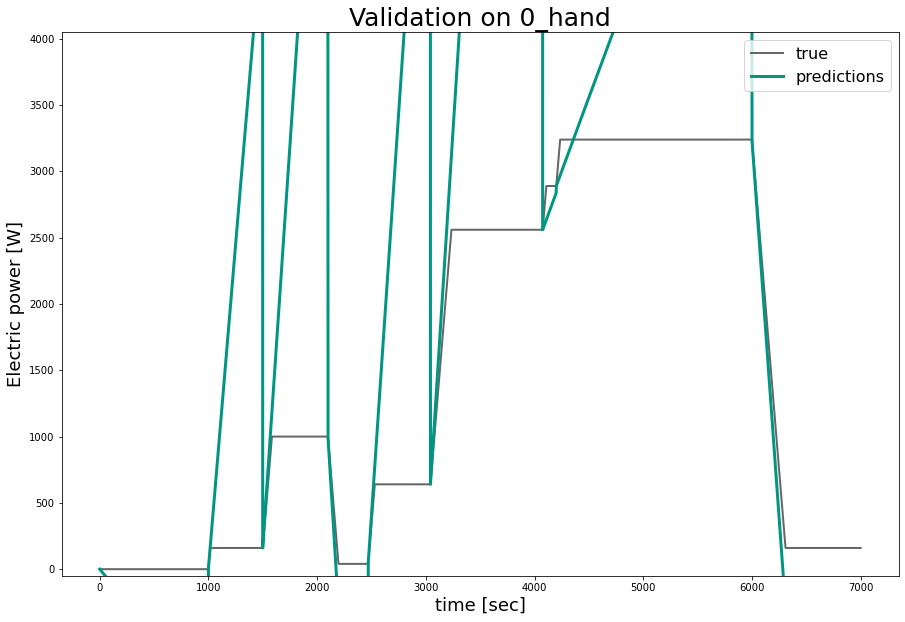

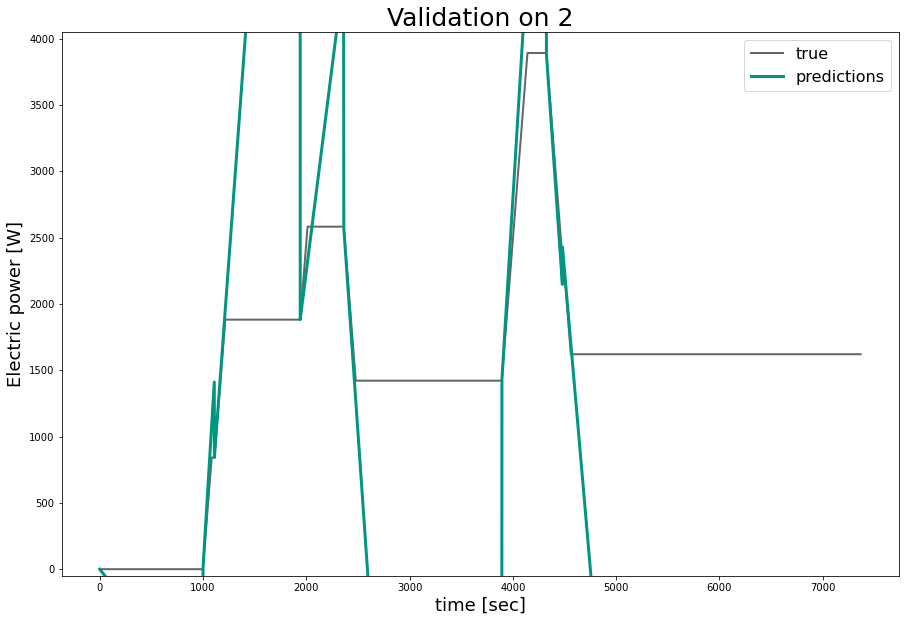

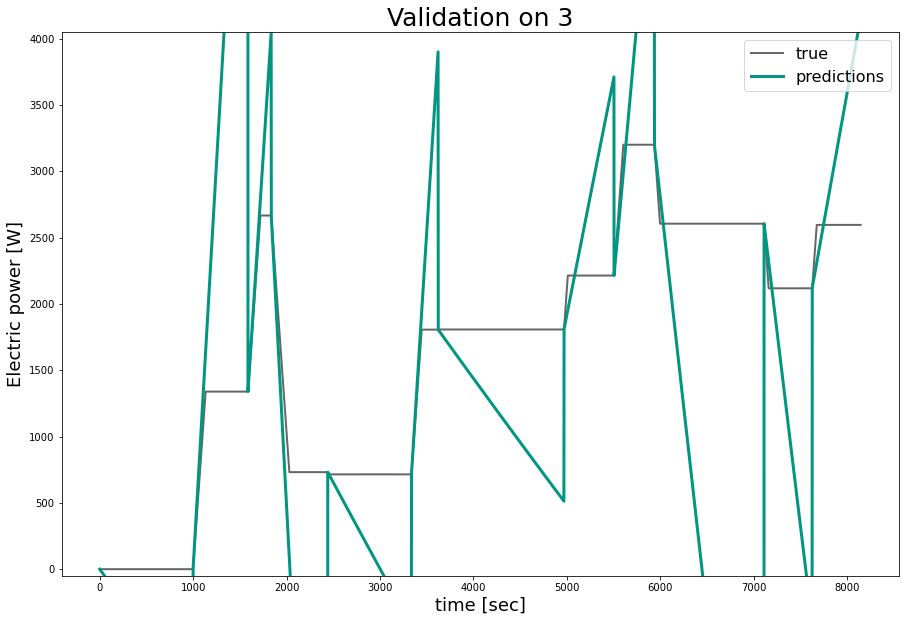

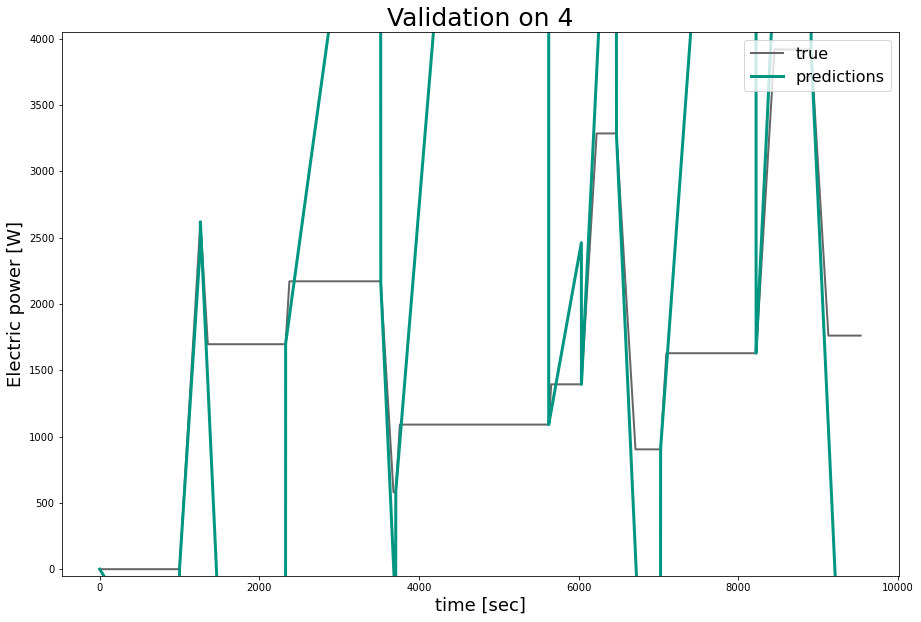

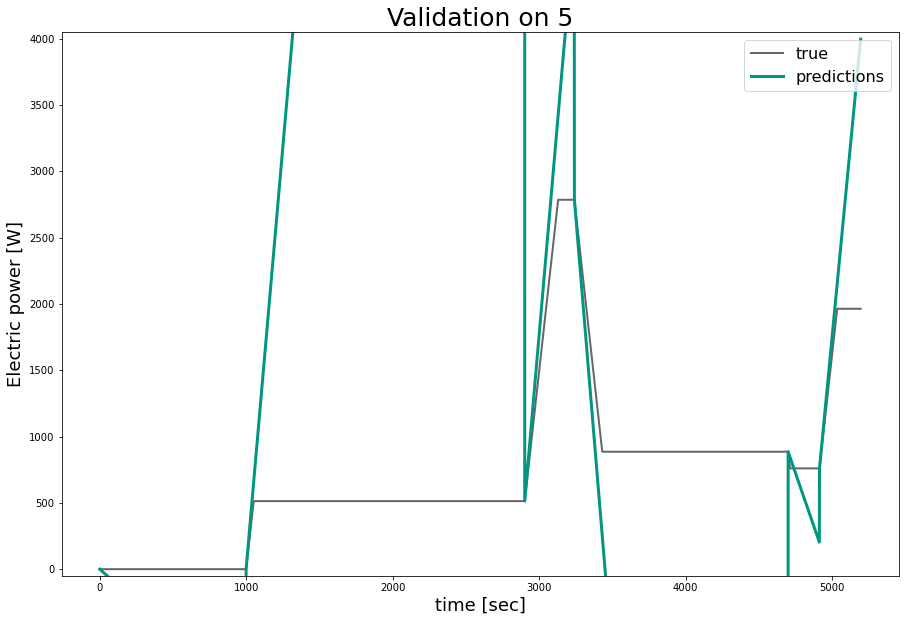

...

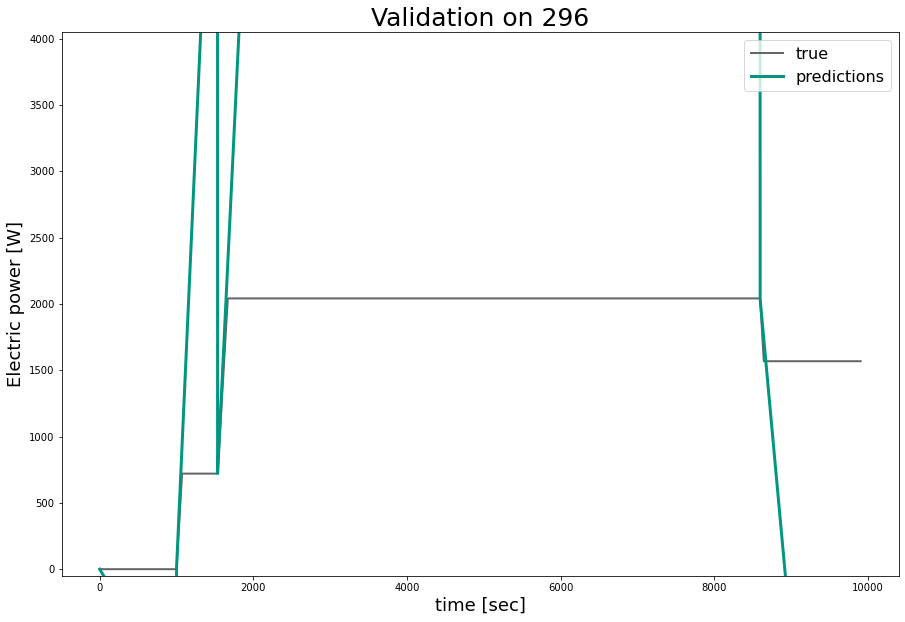

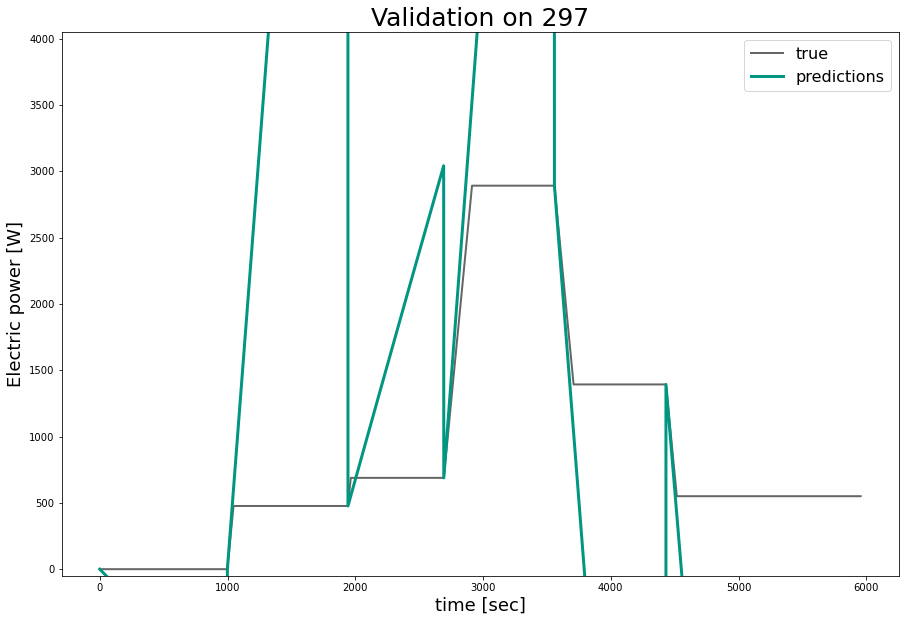

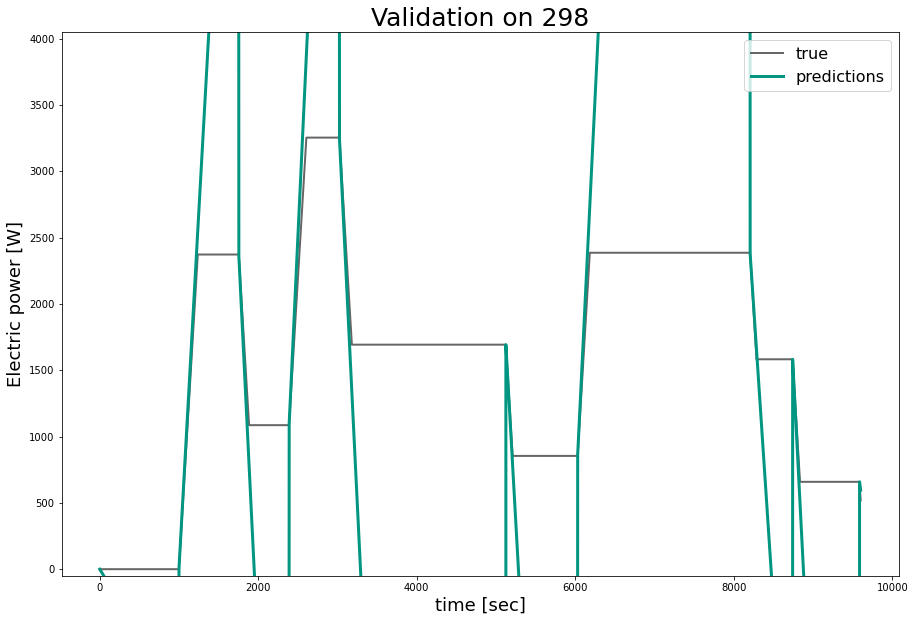

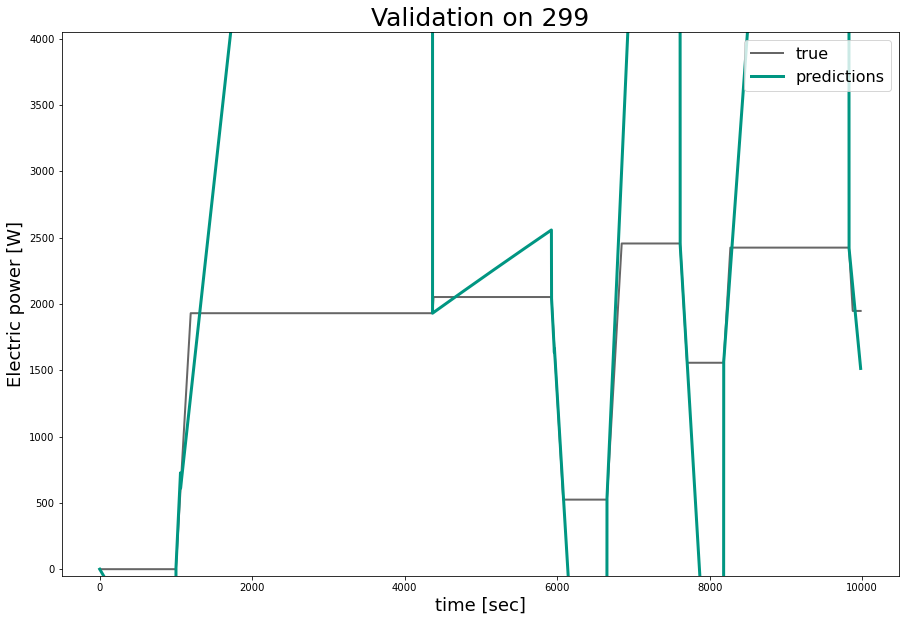

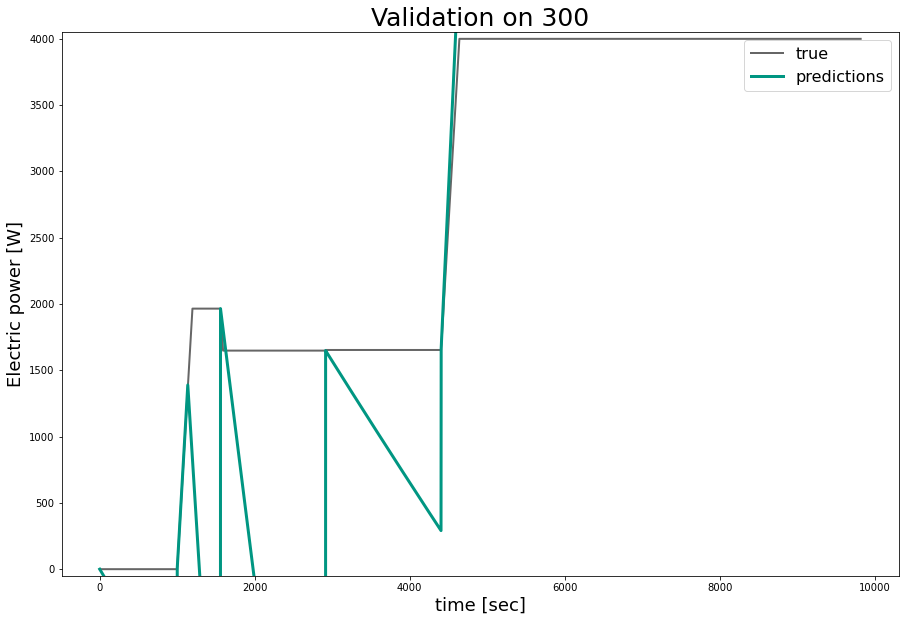

In [25]:
#values = ['spin', 'el', 'th']
values = ['el']
results_df = pd.DataFrame(index = range(len(experiments)), columns = [str(x + "_RMSE") for x in values])

for i in range(len(experiments)):
    res = compare_predictions(experiments[i], names[i], models_1, values)
    results_df.iloc[i] = res[0][0]
    
results_df.to_csv(image_folder + '99_results.csv', sep = "|", encoding="utf-8")